# Adult Income Census Prediction

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import warnings
warnings.filterwarnings('ignore')

In [2]:
data_frame=pd.read_csv('adult.csv')

In [3]:
data_frame.shape

(32561, 15)

In [4]:
data_frame.head()

,age,workclass,fnlwgt,education,education-num,marital-status,occupation,relationship,race,sex,capital-gain,capital-loss,hours-per-week,country,salary
0,39,State-gov,77516,Bachelors,13,Never-married,Adm-clerical,Not-in-family,White,Male,2174,0,40,United-States,<=50K
1,50,Self-emp-not-inc,83311,Bachelors,13,Married-civ-spouse,Exec-managerial,Husband,White,Male,0,0,13,United-States,<=50K
2,38,Private,215646,HS-grad,9,Divorced,Handlers-cleaners,Not-in-family,White,Male,0,0,40,United-States,<=50K
3,53,Private,234721,11th,7,Married-civ-spouse,Handlers-cleaners,Husband,Black,Male,0,0,40,United-States,<=50K
4,28,Private,338409,Bachelors,13,Married-civ-spouse,Prof-specialty,Wife,Black,Female,0,0,40,Cuba,<=50K


In [5]:
#statistical analysis
#exploratory data analysis
#feature engineering
#feature selection
#machine learning training
#machine learning model selection
#prediction

## Exploratory Data Analysis

- Null values check
- Checking the relation between the categorical and numerical features with output feature
- Histogram
- Count plot
- Heatplot
- Scatter plot
- Box plot
- Distribution plot

In [6]:
data_frame.nunique()

age                  73
workclass             9
fnlwgt            21648
education            16
education-num        16
marital-status        7
occupation           15
relationship          6
race                  5
sex                   2
capital-gain        119
capital-loss         92
hours-per-week       94
country              42
salary                2
dtype: int64

In [7]:
num_cols=data_frame.select_dtypes(include='number').columns
obj_cols=data_frame.select_dtypes(include='object').columns

In [8]:
data_frame[num_cols]

,age,fnlwgt,education-num,capital-gain,capital-loss,hours-per-week
0,39,77516,13,2174,0,40
1,50,83311,13,0,0,13
2,38,215646,9,0,0,40
3,53,234721,7,0,0,40
4,28,338409,13,0,0,40
...,...,...,...,...,...,...
32556,27,257302,12,0,0,38
32557,40,154374,9,0,0,40
32558,58,151910,9,0,0,40
32559,22,201490,9,0,0,20


In [9]:
data_frame[obj_cols]

,workclass,education,marital-status,occupation,relationship,race,sex,country,salary
0,State-gov,Bachelors,Never-married,Adm-clerical,Not-in-family,White,Male,United-States,<=50K
1,Self-emp-not-inc,Bachelors,Married-civ-spouse,Exec-managerial,Husband,White,Male,United-States,<=50K
2,Private,HS-grad,Divorced,Handlers-cleaners,Not-in-family,White,Male,United-States,<=50K
3,Private,11th,Married-civ-spouse,Handlers-cleaners,Husband,Black,Male,United-States,<=50K
4,Private,Bachelors,Married-civ-spouse,Prof-specialty,Wife,Black,Female,Cuba,<=50K
...,...,...,...,...,...,...,...,...,...
32556,Private,Assoc-acdm,Married-civ-spouse,Tech-support,Wife,White,Female,United-States,<=50K
32557,Private,HS-grad,Married-civ-spouse,Machine-op-inspct,Husband,White,Male,United-States,>50K
32558,Private,HS-grad,Widowed,Adm-clerical,Unmarried,White,Female,United-States,<=50K
32559,Private,HS-grad,Never-married,Adm-clerical,Own-child,White,Male,United-States,<=50K


In [10]:
data_frame[num_cols].nunique()

age                  73
fnlwgt            21648
education-num        16
capital-gain        119
capital-loss         92
hours-per-week       94
dtype: int64

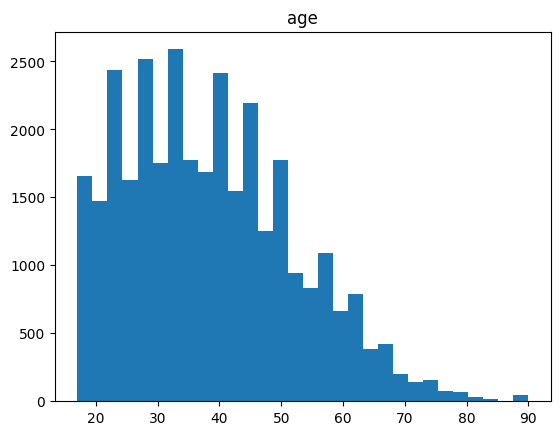

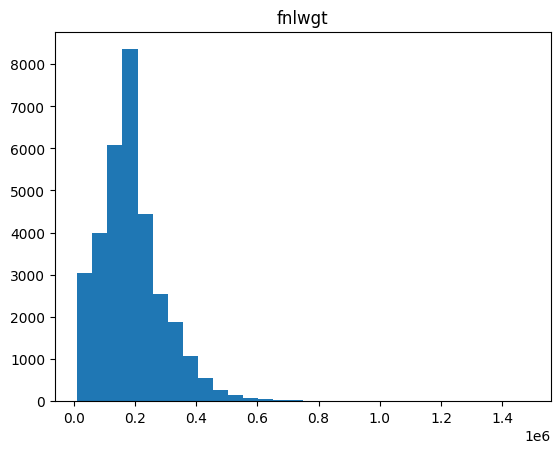

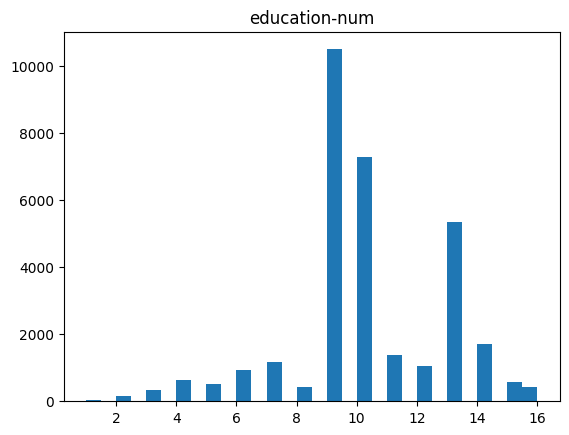

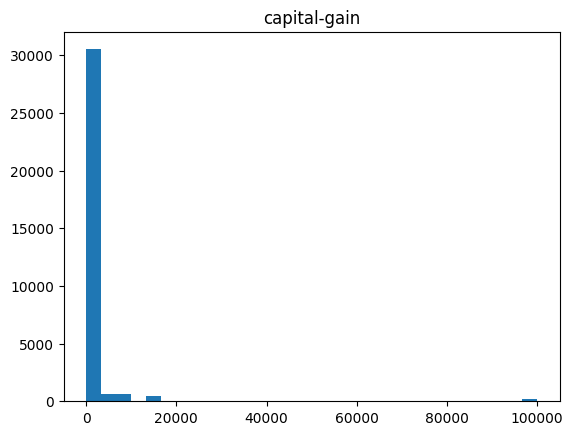

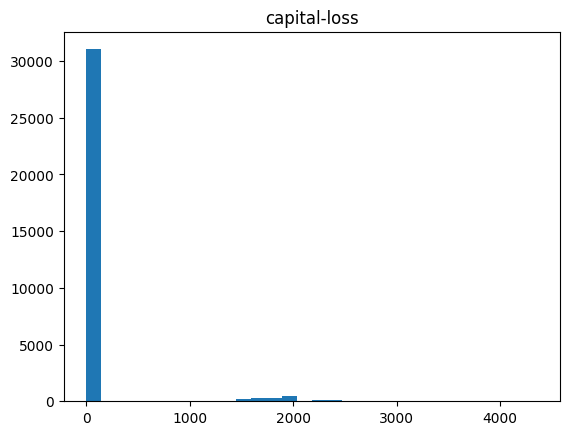

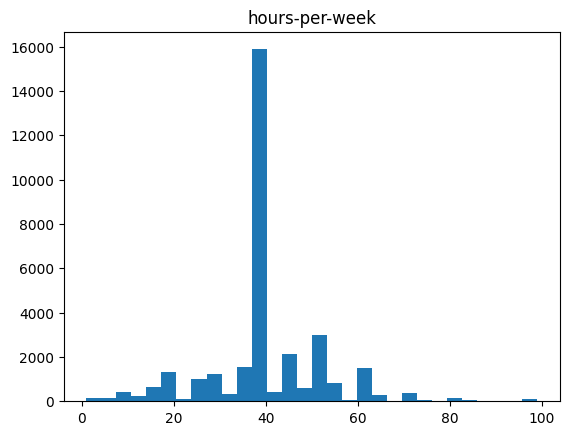

In [11]:
for col in num_cols:
    plt.title(col);
    plt.hist(data_frame[col],bins=30);
    plt.show();

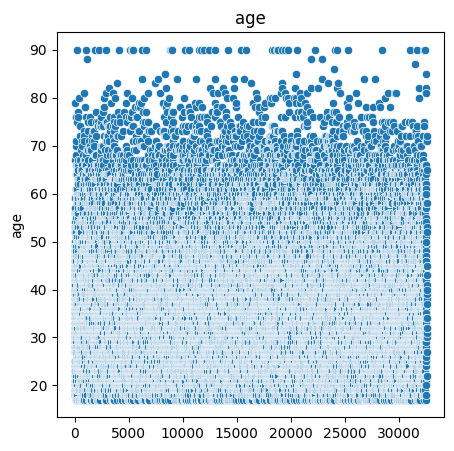

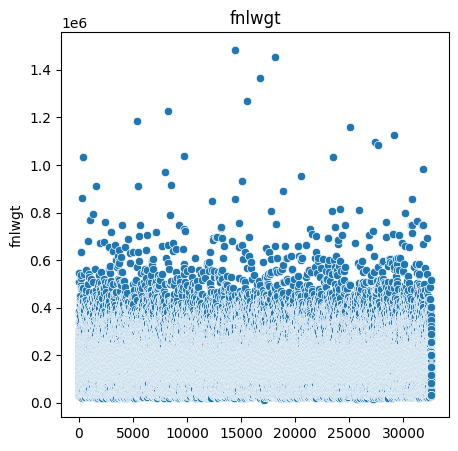

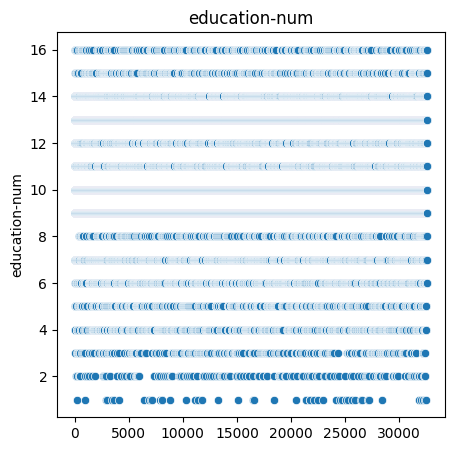

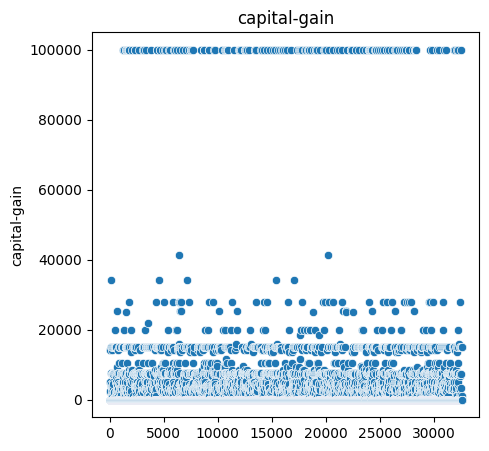

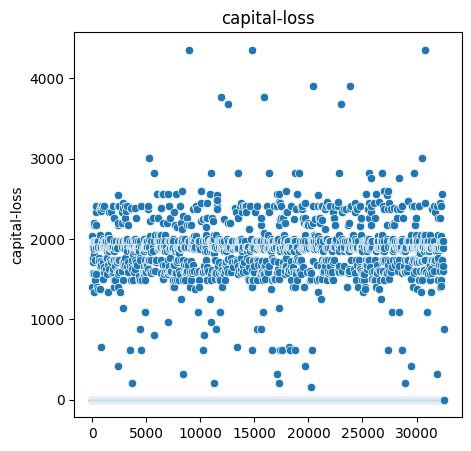

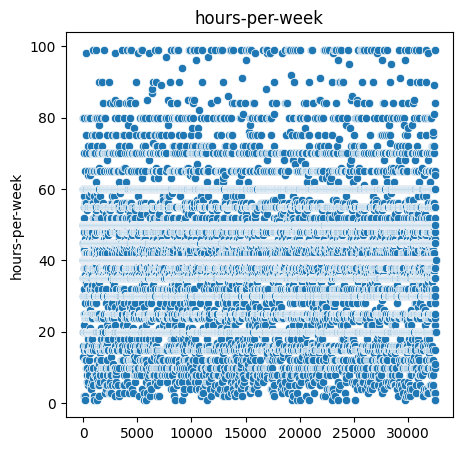

In [12]:
#checking the patterns in numeric data
for col in num_cols:
    plt.figure(figsize=(5,5));
    plt.title(col)
    sns.scatterplot(data_frame[col]);
    plt.show();

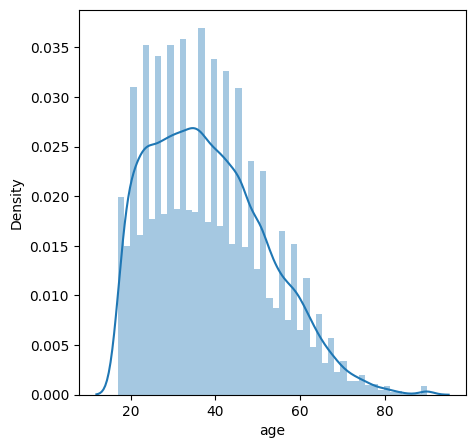

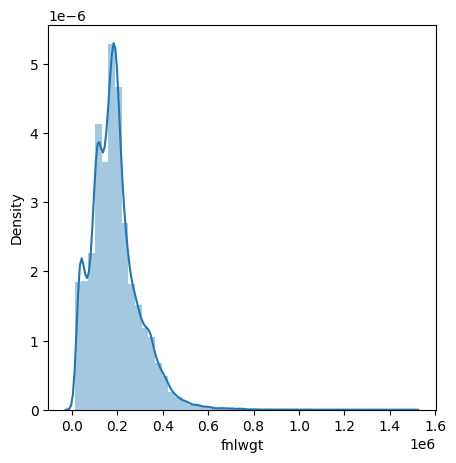

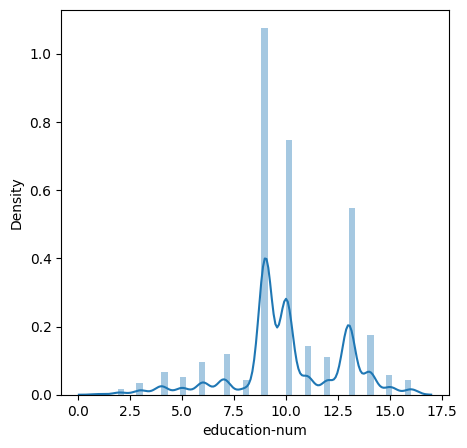

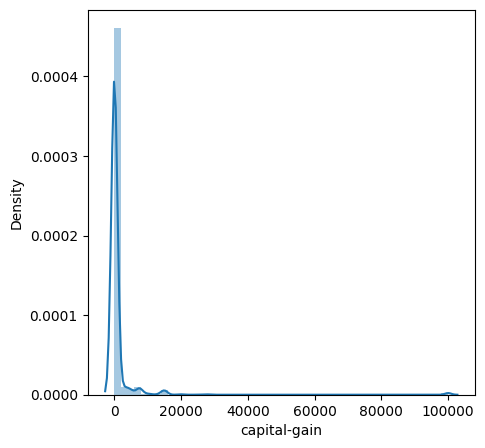

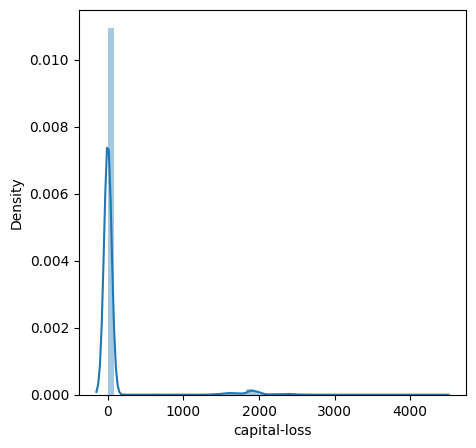

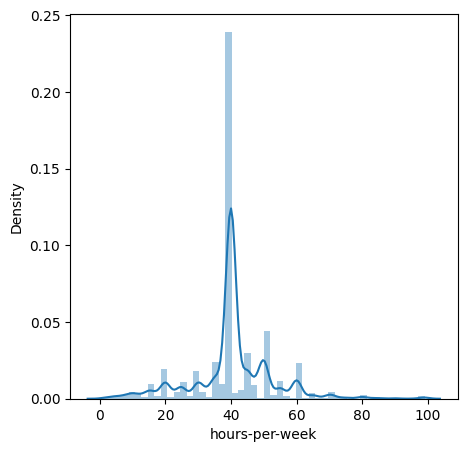

In [13]:
#checking the distplot in numeric data
for col in num_cols:
    plt.figure(figsize=(5,5))
    sns.distplot(data_frame[col]);
    plt.show();

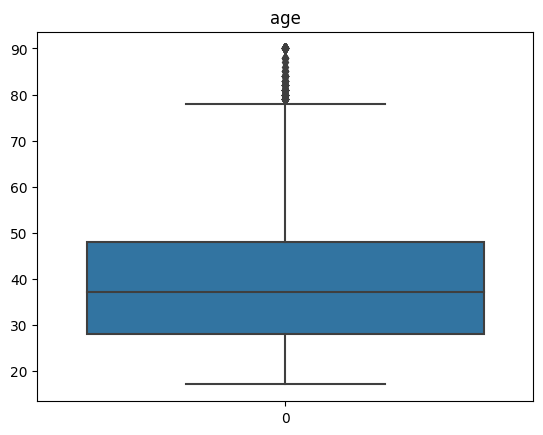

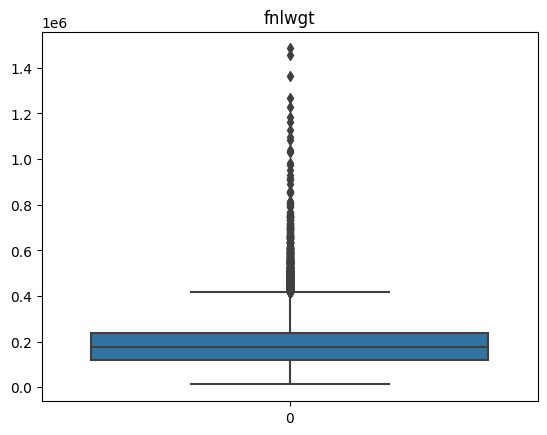

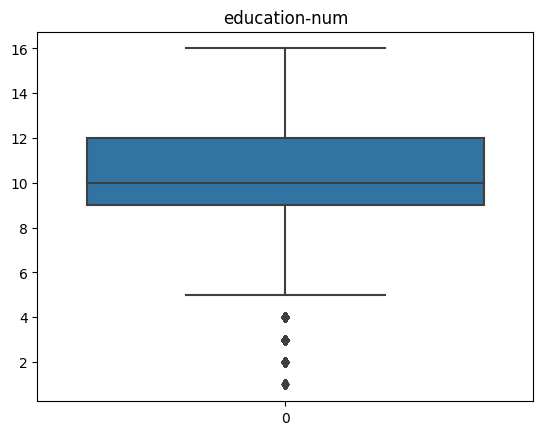

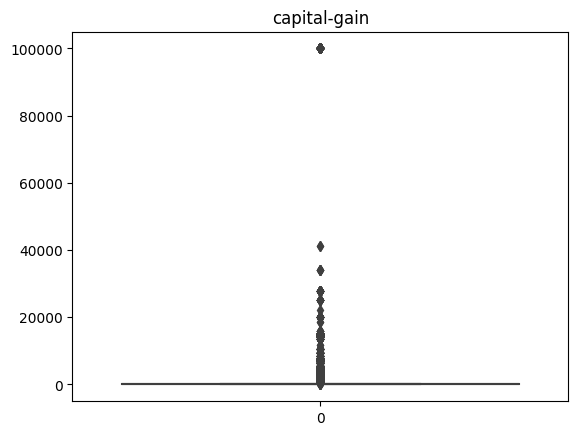

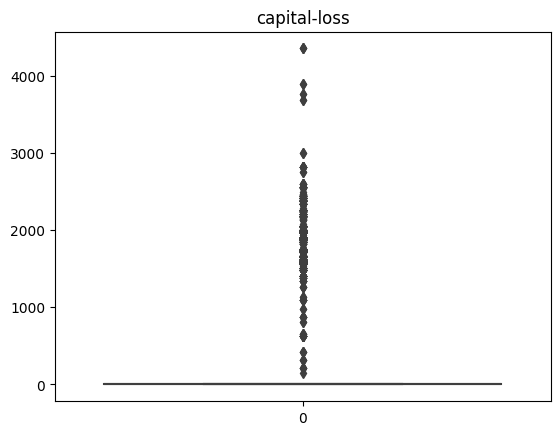

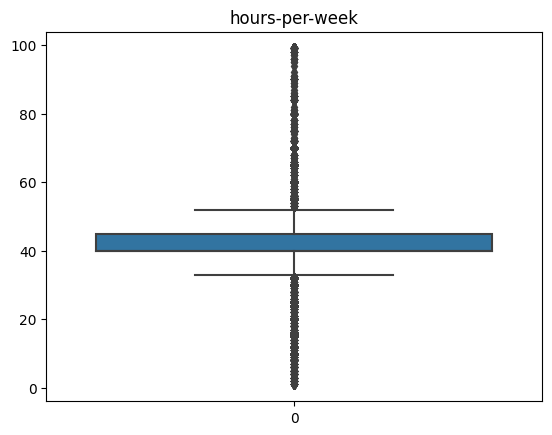

In [14]:
#checking the boxplot
for col in num_cols:
    plt.title(col)
    sns.boxplot(data_frame[col]);
    plt.show();

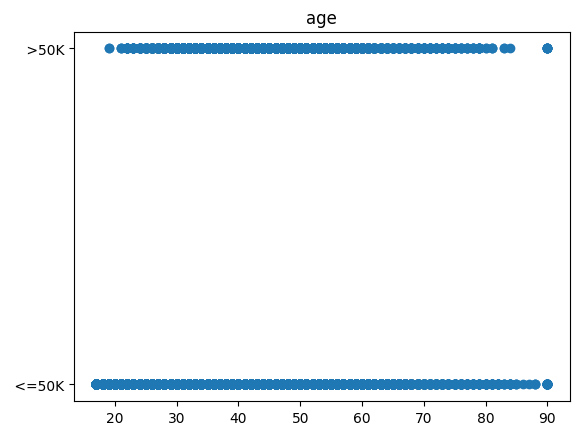

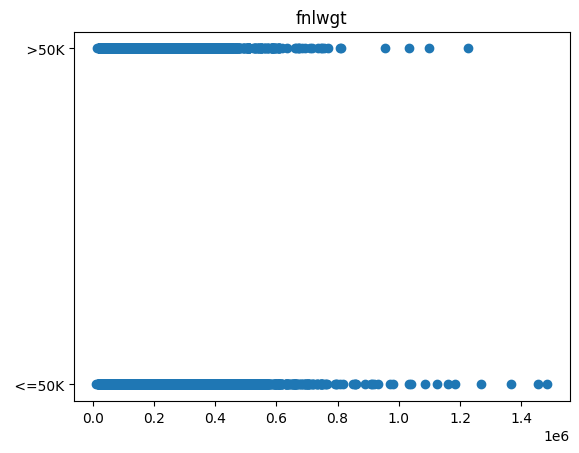

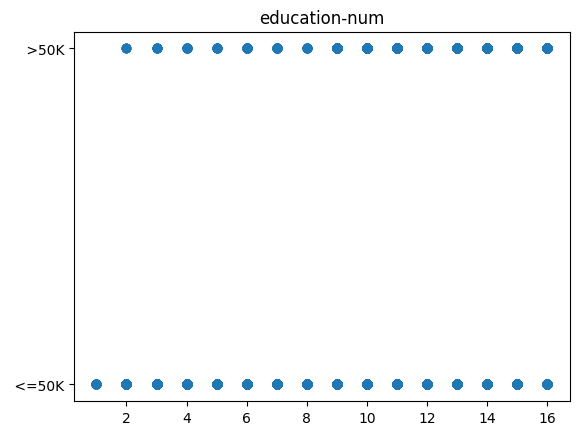

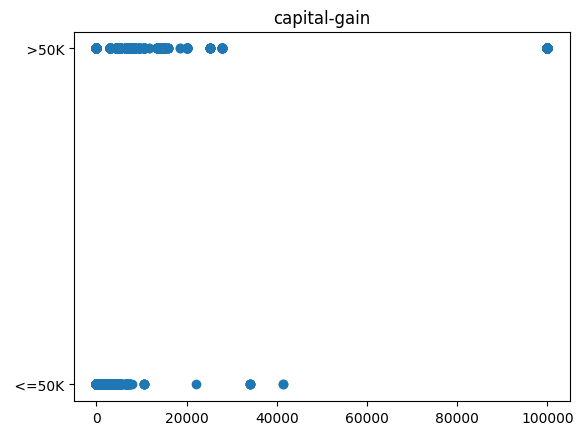

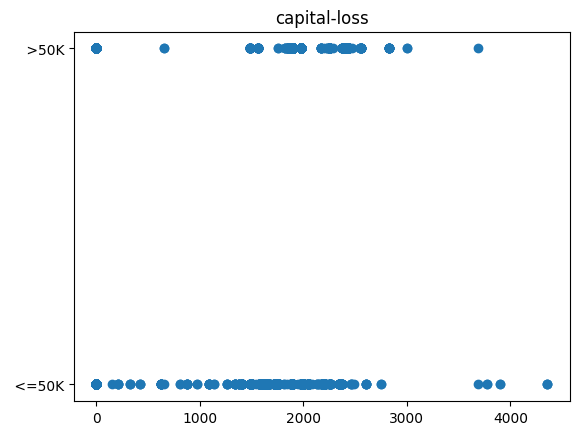

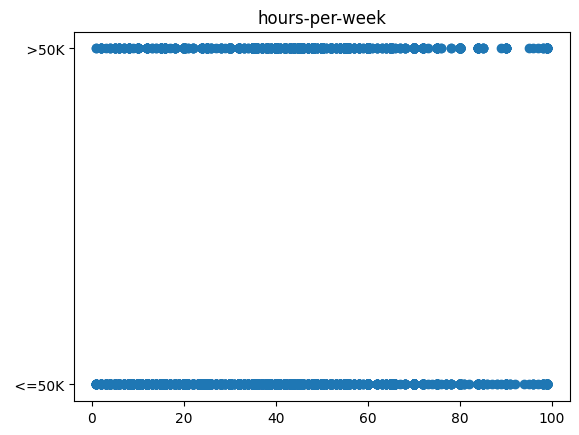

In [15]:
#finding the relation between the categorical features and output feature
for col in num_cols:
    plt.title(col)
    plt.scatter(data_frame[col],data_frame['salary']);
    plt.show();

### Checking the relation between the categorical feature and output feature

In [16]:
obj_cols

Index(['workclass', 'education', 'marital-status', 'occupation',
       'relationship', 'race', 'sex', 'country', 'salary'],
      dtype='object')

Checking for workclass


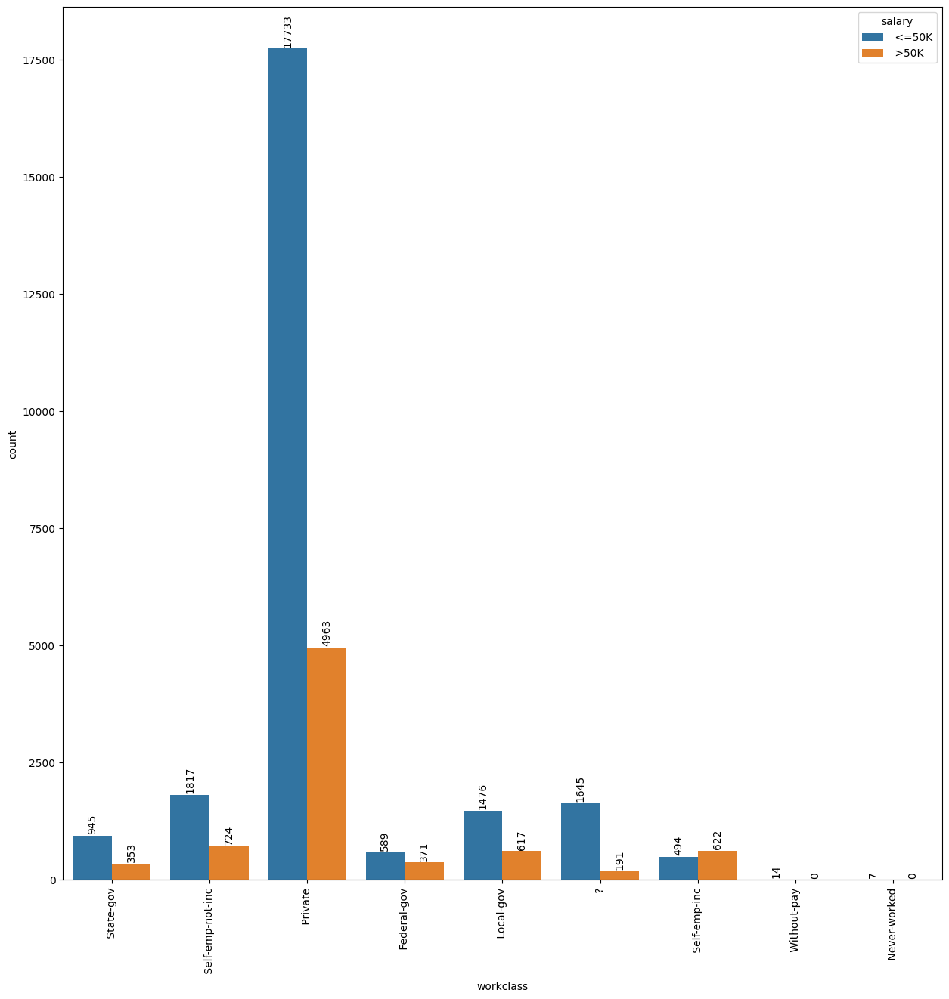

Checking for education


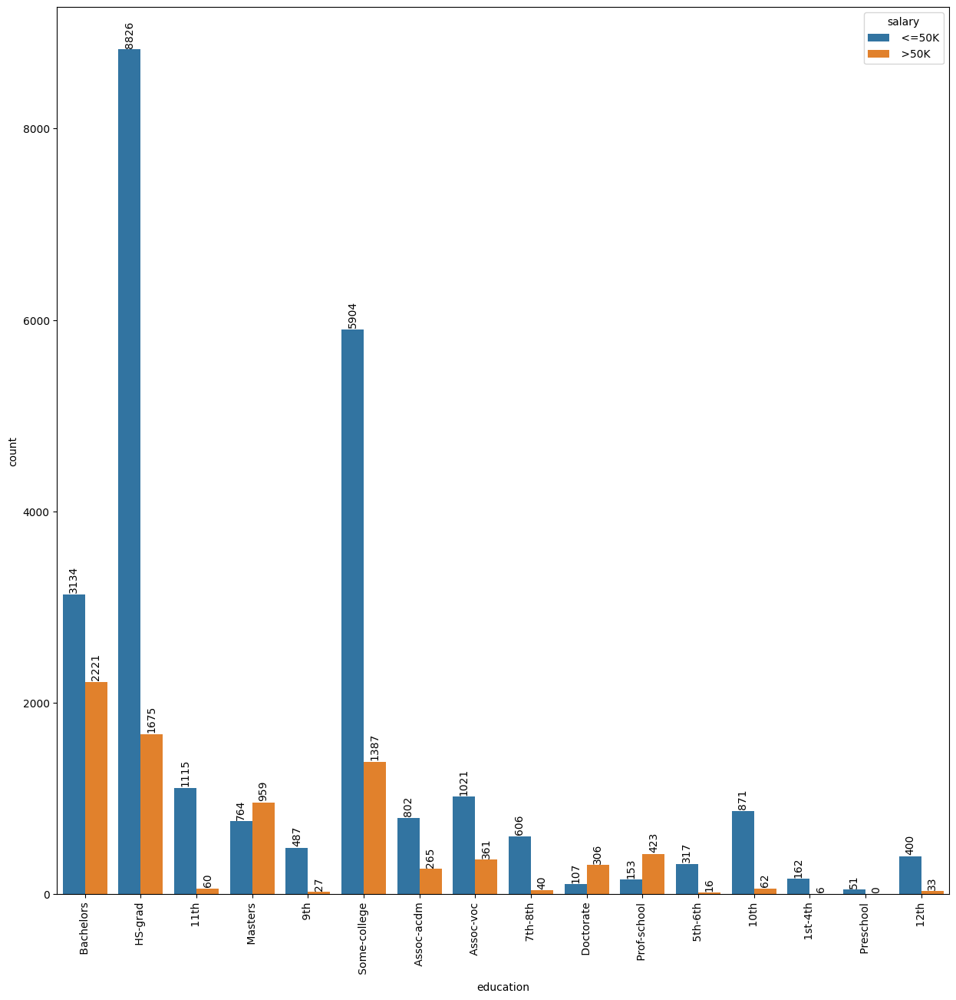

Checking for marital-status


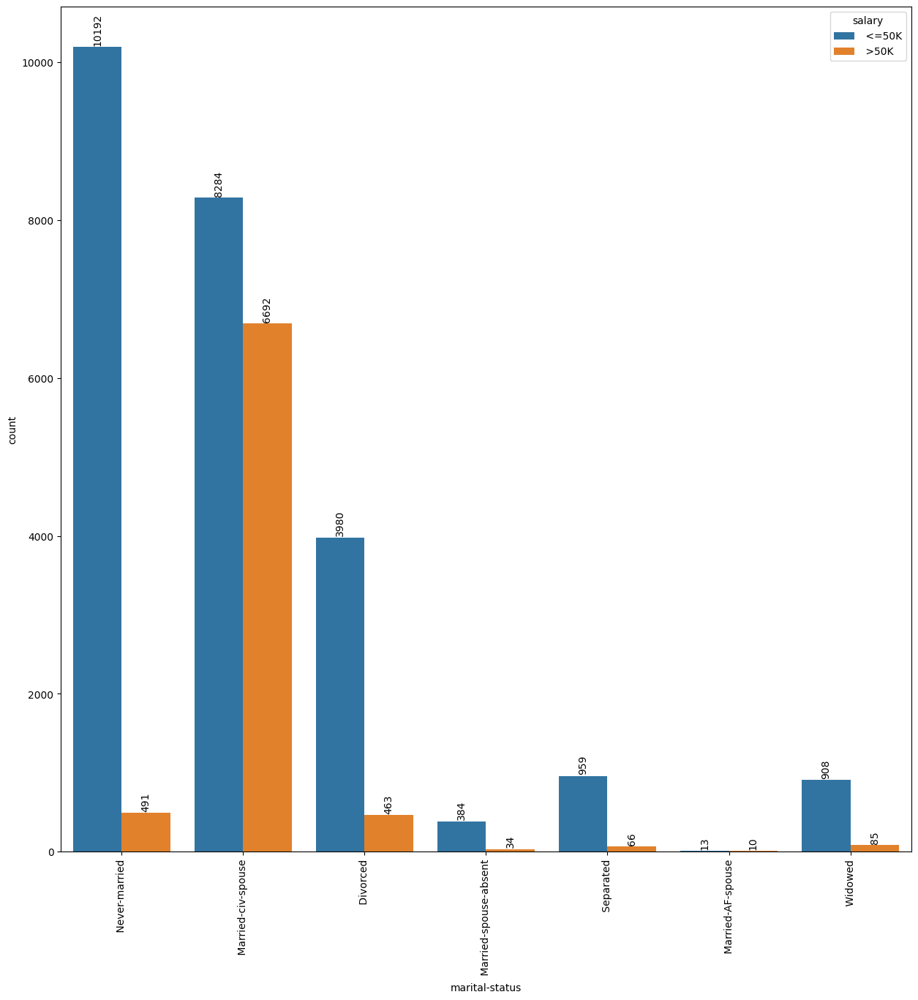

Checking for occupation


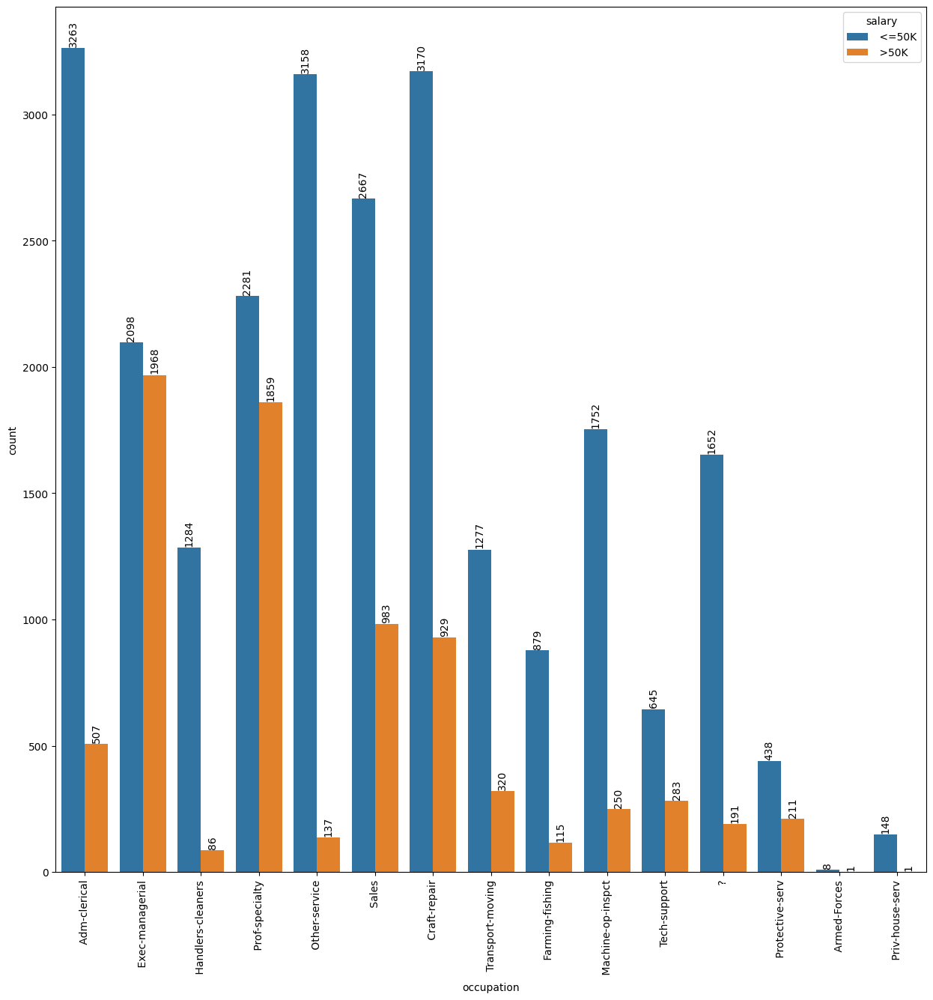

Checking for relationship


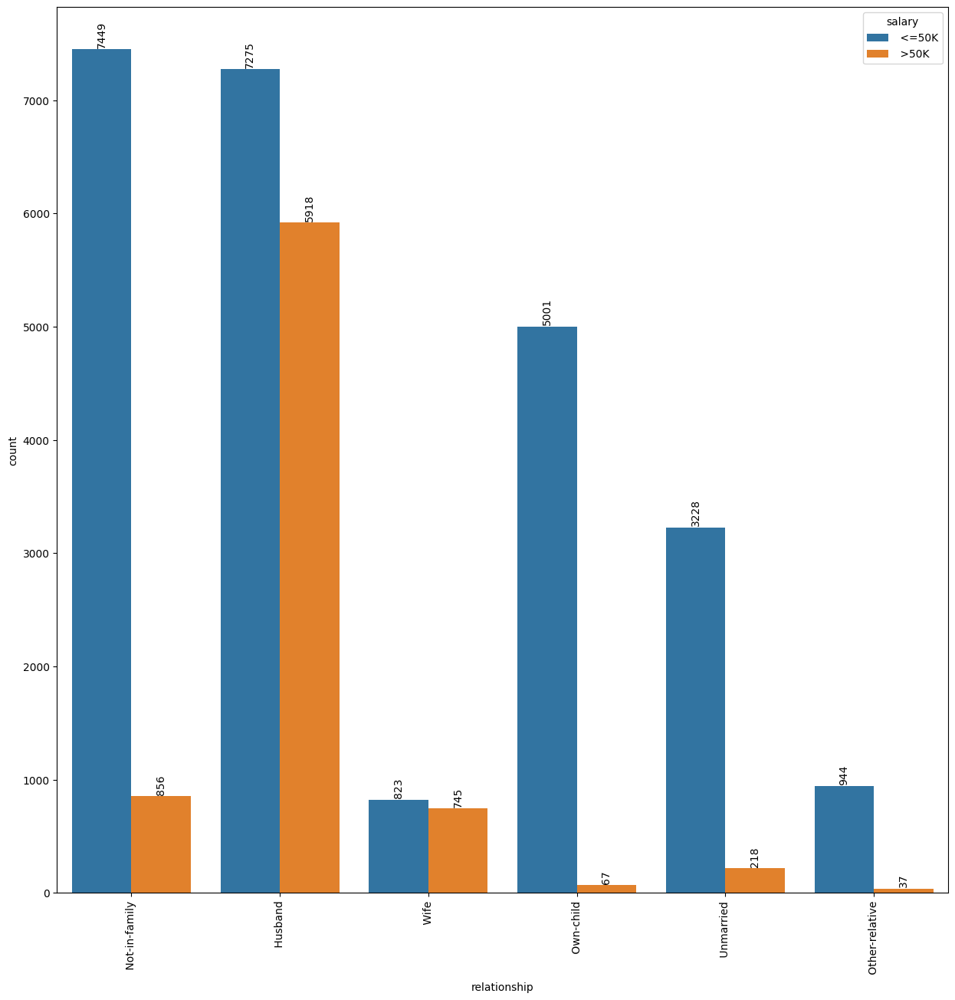

Checking for race


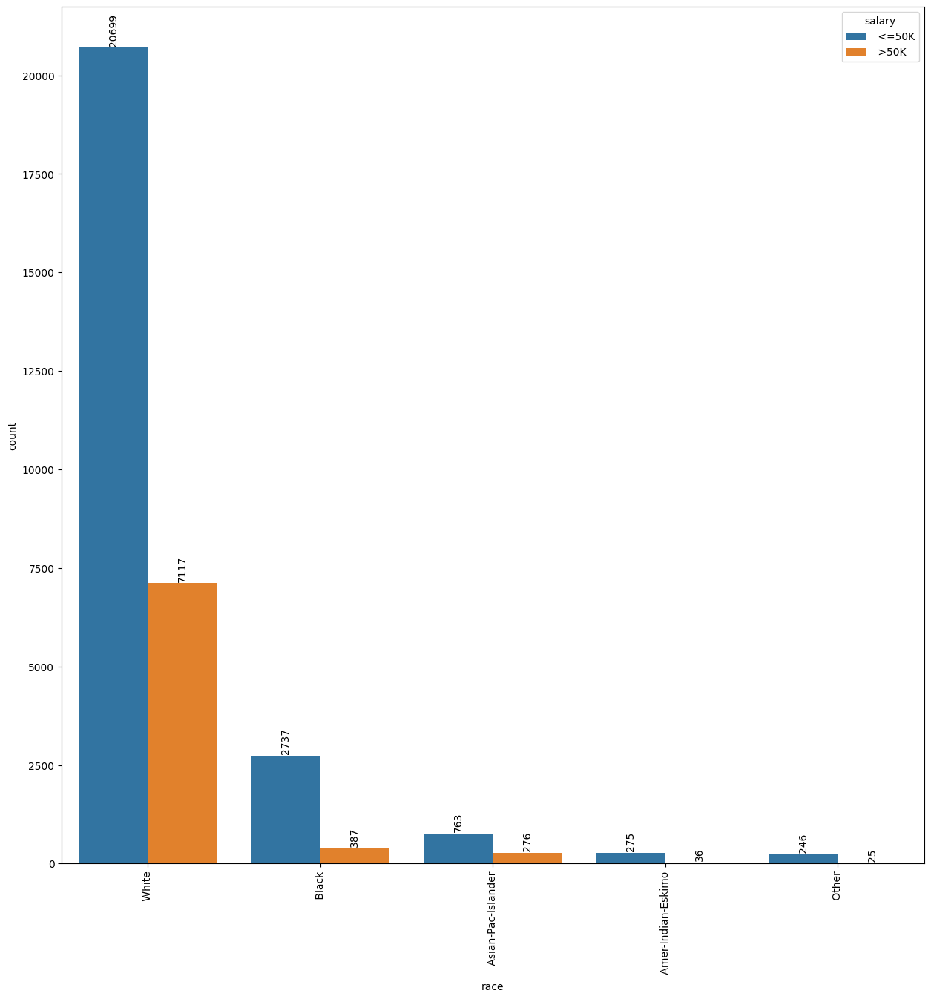

Checking for sex


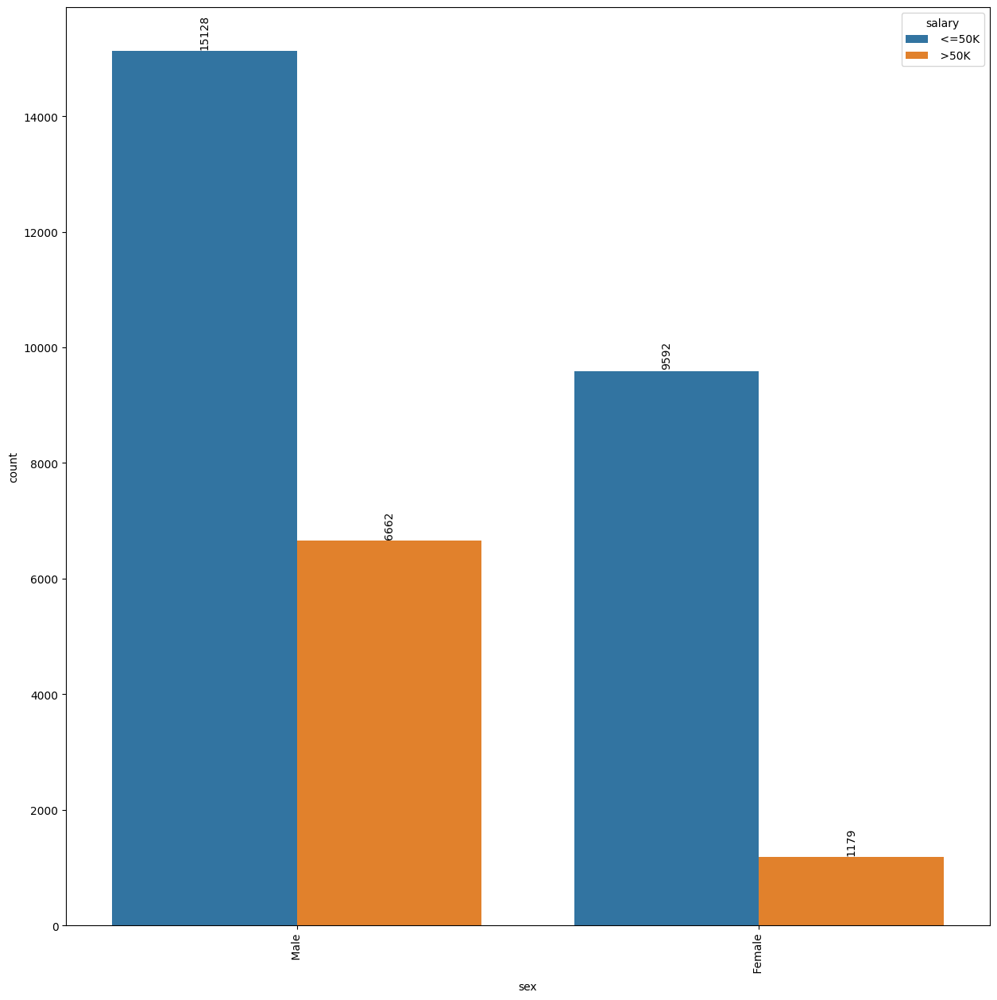

Checking for country


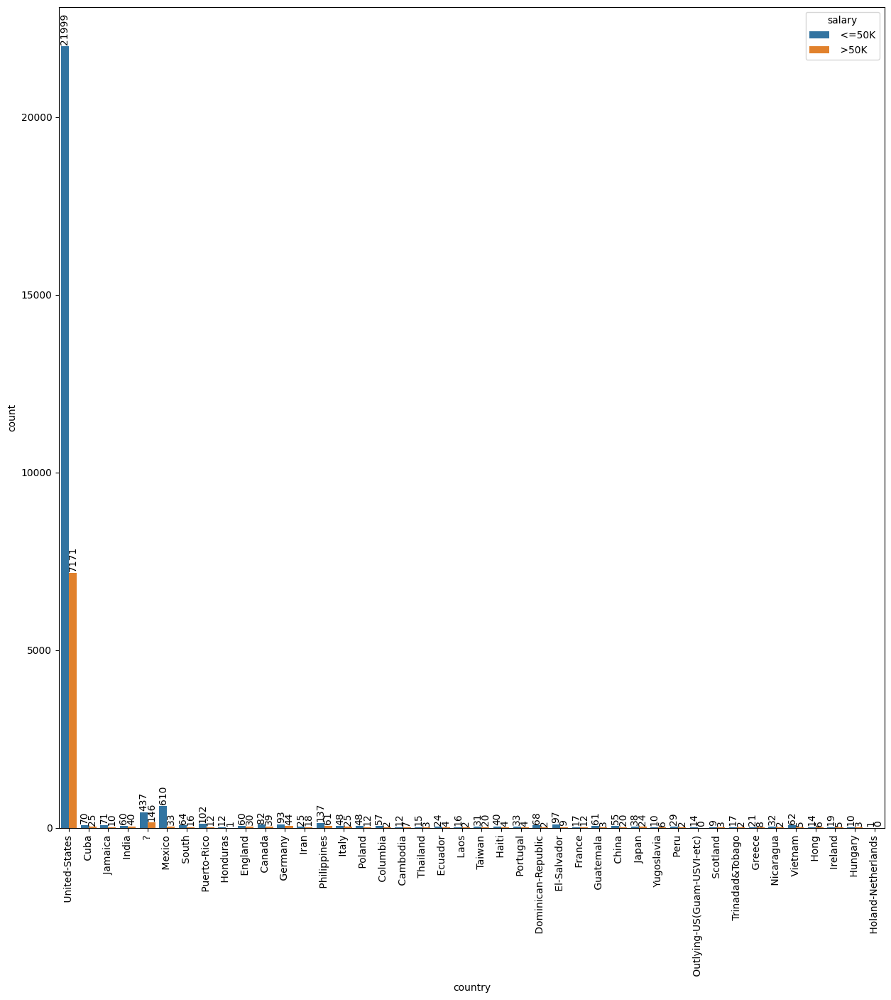

Checking for salary


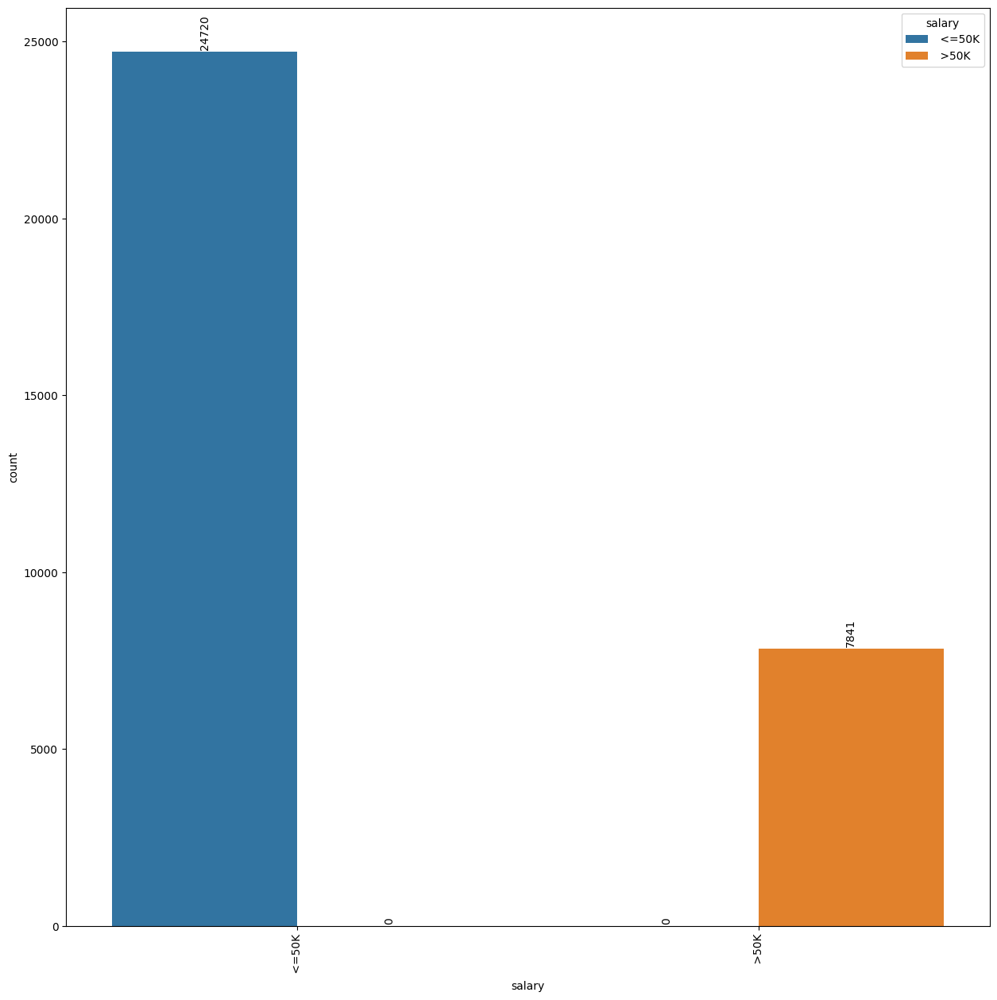

In [134]:
for col in obj_cols:
    print('Checking for '+col)
    #checking for workclass
    plt.figure(figsize=(15,15))
    ax=sns.countplot(data=data_frame,x=col,hue=data_frame['salary']);
    for container in ax.containers:
        ax.bar_label(container,fmt='%d',rotation=90,label_type='edge',padding=1.5)
    plt.xticks(rotation=90);
    plt.show();

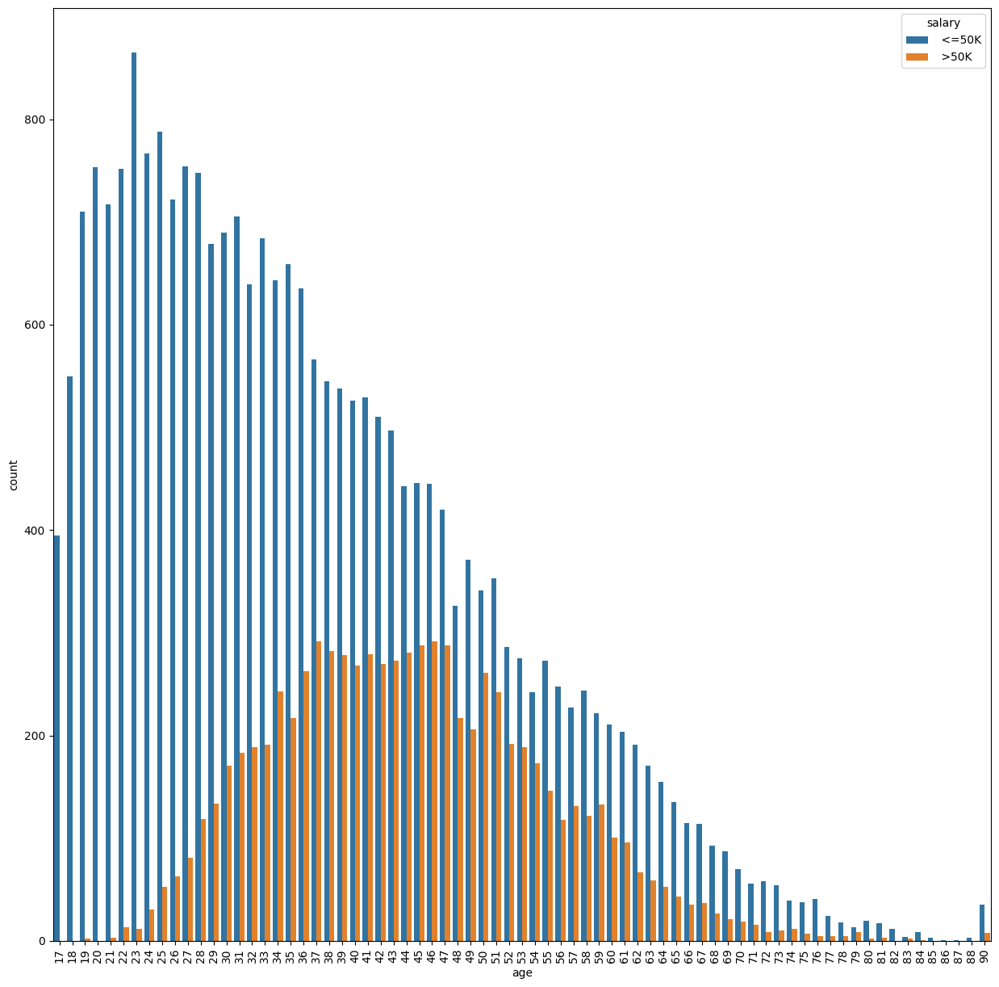

In [18]:
plt.figure(figsize=(15,15))
sns.countplot(data=data_frame,x='age',hue='salary');
plt.xticks(rotation=90);

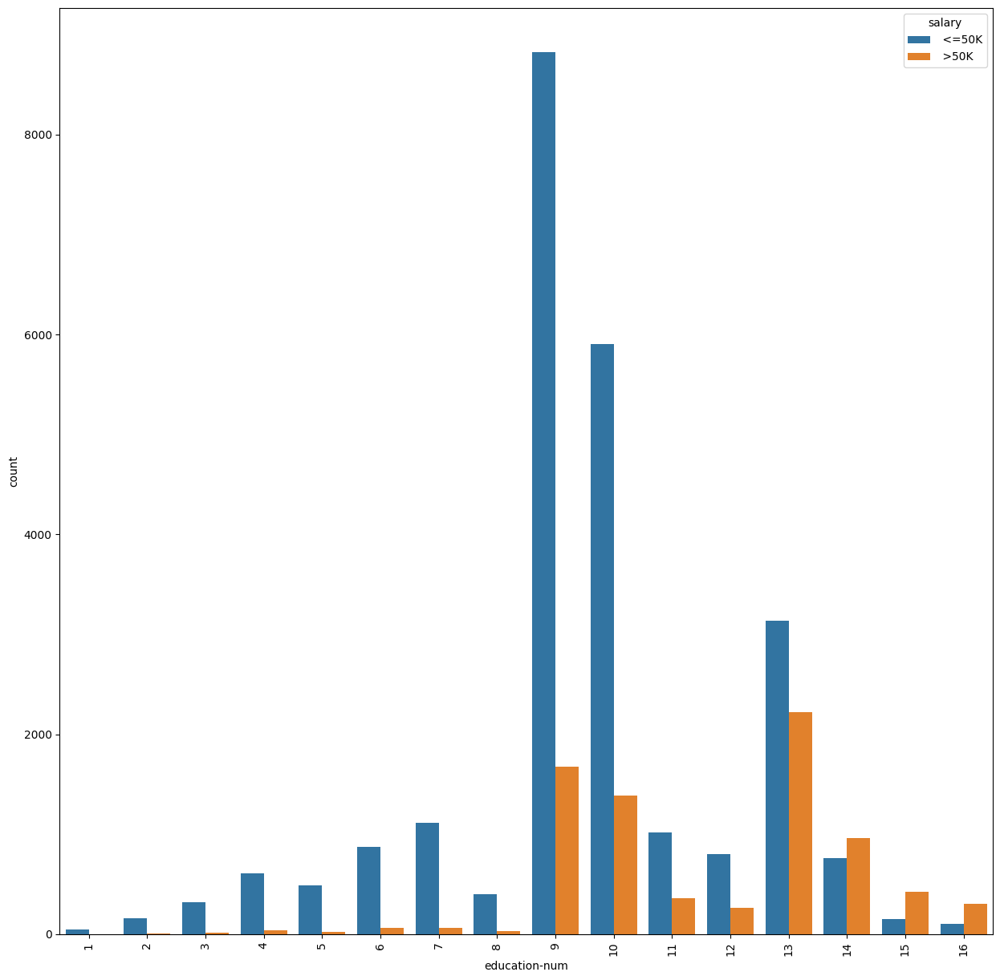

In [114]:
plt.figure(figsize=(15,15))
sns.countplot(data=data_frame,x='education-num',hue='salary');
plt.xticks(rotation=90);

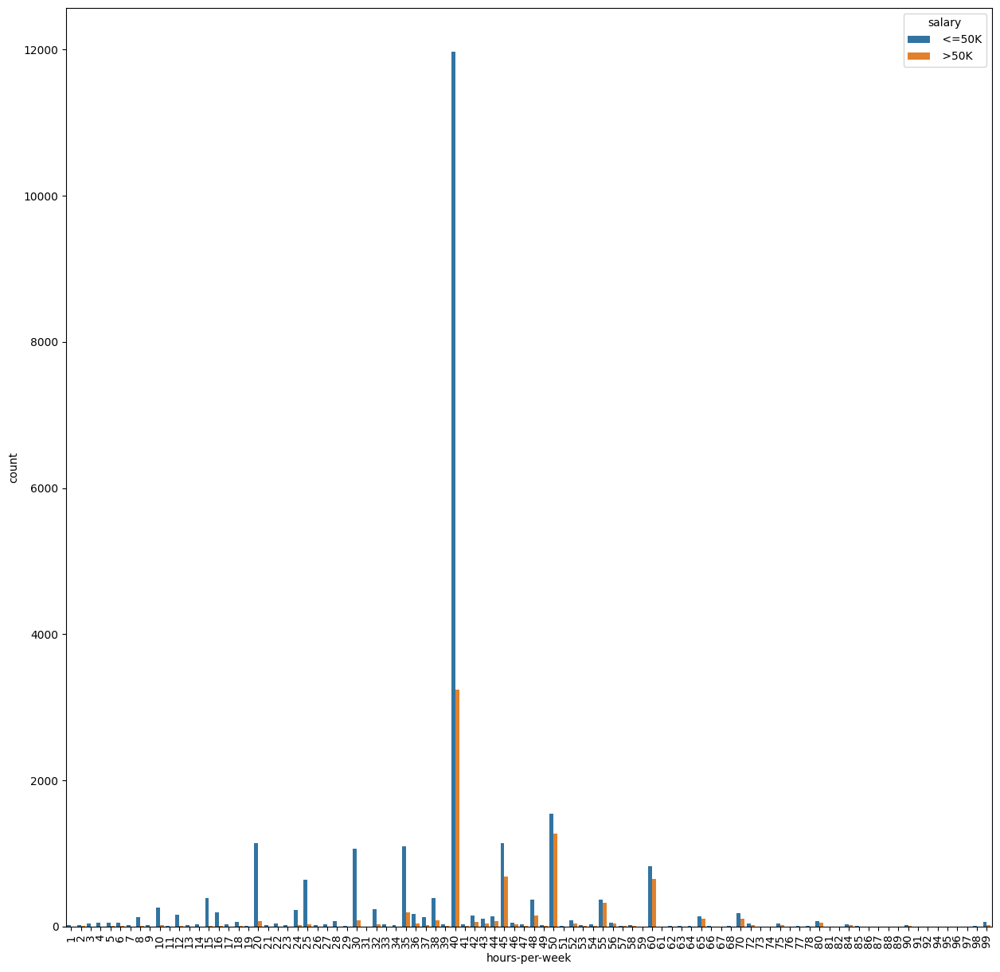

In [116]:
plt.figure(figsize=(15,15))
sns.countplot(data=data_frame,x='hours-per-week',hue='salary');
plt.xticks(rotation=90);

### Checking the outliers in numeric columns such as continuos featues

In [19]:
num_cols

Index(['age', 'fnlwgt', 'education-num', 'capital-gain', 'capital-loss',
       'hours-per-week'],
      dtype='object')

In [20]:
data_frame[num_cols].head()

,age,fnlwgt,education-num,capital-gain,capital-loss,hours-per-week
0,39,77516,13,2174,0,40
1,50,83311,13,0,0,13
2,38,215646,9,0,0,40
3,53,234721,7,0,0,40
4,28,338409,13,0,0,40


In [21]:
data_frame[num_cols].nunique()

age                  73
fnlwgt            21648
education-num        16
capital-gain        119
capital-loss         92
hours-per-week       94
dtype: int64

Here we're going to get the outliers for fnlwgt because of its number of unique values more than the other feature values.

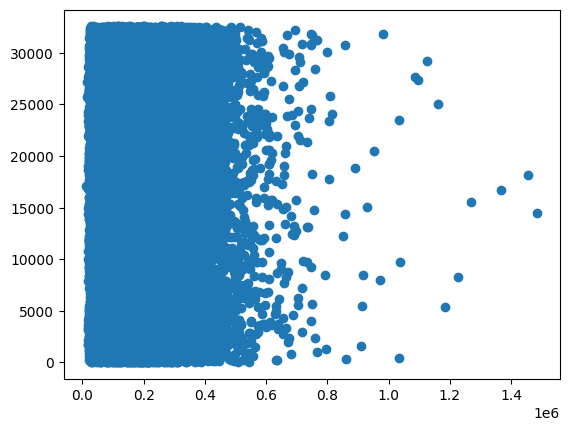

In [22]:
plt.scatter(data_frame['fnlwgt'],range(len(data_frame)));
plt.show();

<AxesSubplot: >

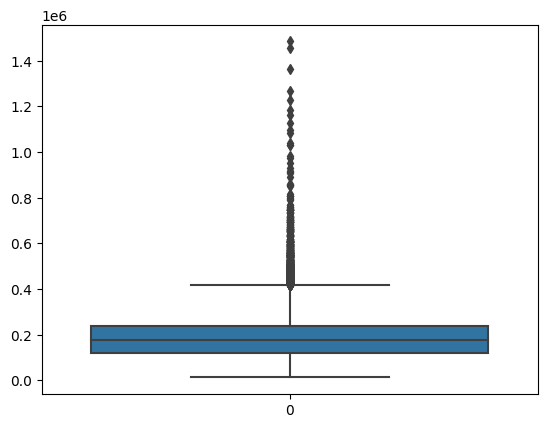

In [23]:
sns.boxplot(data_frame['fnlwgt'])

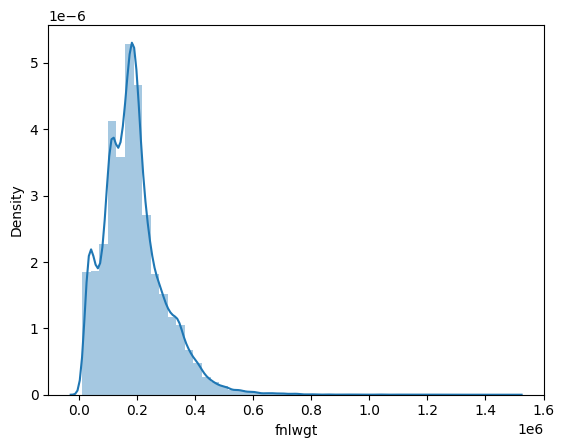

In [24]:
sns.distplot(data_frame['fnlwgt']);

Currently it is left skewed. So, let us remove the outliers and check the distribution again.

In [25]:
#Before that, we are going to normalize the values

In [26]:
from sklearn import preprocessing

In [27]:
#outliers for fnlwgt
def outliers(data):
    mean=np.mean(data)
    std=np.std(data)
    outlier_values=[]
    threshold=3
    for val in data:
        z_score=(val-mean)/std
        if z_score>=threshold:
            outlier_values.append(val)
    return outlier_values

In [28]:
#checking the outliers for fnlwgt column in dataframe

In [29]:
outlier_values=outliers(data_frame['fnlwgt'])

In [30]:
outlier_values[:10]

[544091,
 507875,
 633742,
 523910,
 635913,
 538583,
 860348,
 1033222,
 543162,
 556660]

In [31]:
print('Length of outlier values: ',len(outlier_values))

Length of outlier values:  347


Histogram plot for fnlwgt column in dataframe


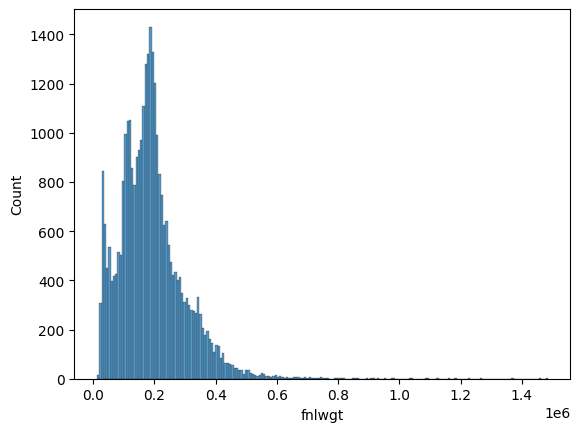

In [32]:
print('Histogram plot for fnlwgt column in dataframe')
sns.histplot(data_frame['fnlwgt']);

In [33]:
#transforming the values in fnlwgt 
transformed_values=np.sqrt(data_frame['fnlwgt'])

In [34]:
transformed_outlier_values=outliers(transformed_values)

In [35]:
print('Length of square root transformed outliers: ',len(transformed_outlier_values))

Length of square root transformed outliers:  137


In [36]:
transformed_outlier_values[:10]

[796.0791417943319,
 797.441533907032,
 927.5494595977079,
 1016.4752825327333,
 824.8575634617167,
 876.0154108233485,
 892.093044474622,
 954.147787295029,
 820.007317040525,
 821.8400087608293]

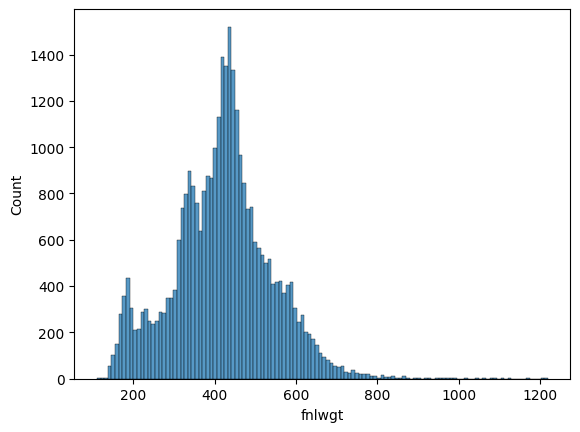

In [37]:
sns.histplot(transformed_values);

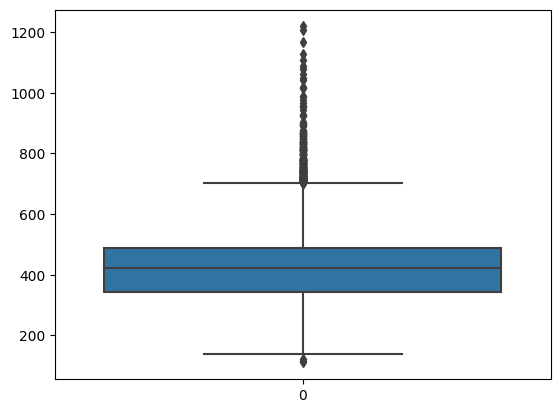

In [38]:
sns.boxplot(transformed_values);

In [39]:
#Transforming the values in log values
log_values=np.log(data_frame['fnlwgt'])

In [40]:
log_outlier_values=outliers(log_values)

In [41]:
print('Number of outlier values after log transformation: ',len(log_outlier_values))

Number of outlier values after log transformation:  10


In [42]:
log_outlier_values[:10]

[13.984934294322313,
 14.019742812629094,
 14.210726657286123,
 14.053218728405351,
 14.127485162985087,
 14.190815382977547,
 13.965104873310317,
 13.908502598413097,
 13.897565086721821,
 13.9338383341115]

In [43]:
log_outlier_values

[13.984934294322313,
 14.019742812629094,
 14.210726657286123,
 14.053218728405351,
 14.127485162985087,
 14.190815382977547,
 13.965104873310317,
 13.908502598413097,
 13.897565086721821,
 13.9338383341115]

Histogram plot to check the outliers


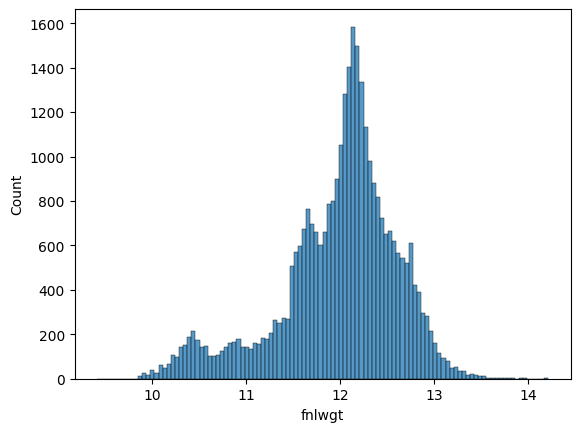

In [44]:
print('Histogram plot to check the outliers')
sns.histplot(log_values);

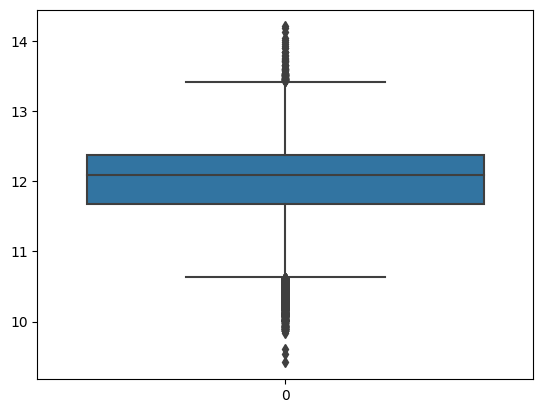

In [45]:
sns.boxplot(log_values);

But, When we look at the box plot we see that there are so many values beyond the lower or higher fence.

In [46]:
#We still find the outlier values after transforming into log values. 
#So, we scale the values between 0 and 1.
scaler=preprocessing.StandardScaler()
scaled_values=scaler.fit_transform(data_frame[['fnlwgt']])

In [47]:
print('Length of outliers in scaled values: ',len(outliers(scaled_values)))

Length of outliers in scaled values:  347


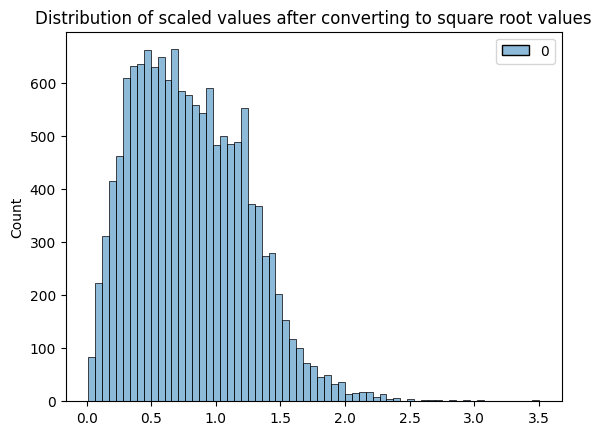

In [48]:
#Converting the scaled values into square root values
plt.title('Distribution of scaled values after converting to square root values')
sns.histplot(np.sqrt(scaled_values))
plt.show();

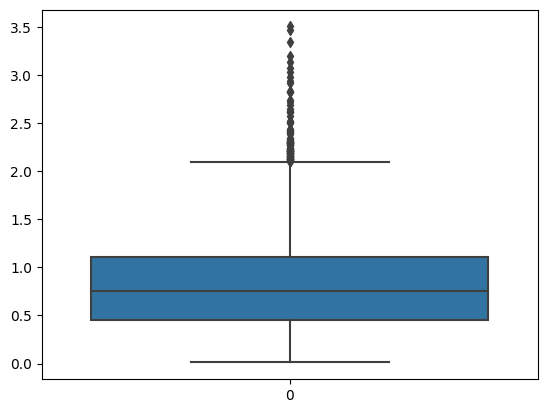

In [49]:
#Checking for the values beyond the fence after converting the scaled values to square root values
sns.boxplot(np.sqrt(scaled_values));

In [50]:
#Scaling the values into MinMaxScaler
minmax_scaler=preprocessing.MinMaxScaler()
mms_values=minmax_scaler.fit_transform(data_frame[['fnlwgt']])

In [51]:
print('Length of outliers in minmax scaled values: ',len(outliers(mms_values)))

Length of outliers in minmax scaled values:  347


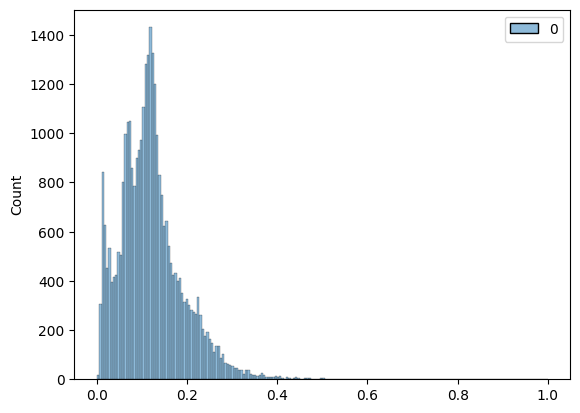

In [52]:
sns.histplot(mms_values);

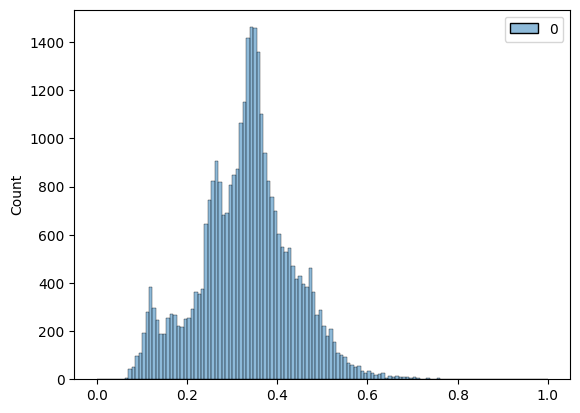

In [53]:
sns.histplot(np.sqrt(mms_values));

In [54]:
#outliers of minmax scaled values transformed into square root values
print(len(outliers(np.sqrt(mms_values))))

115


In [55]:
#outliers of minmax scaled values transformed into log values
print(len(outliers(np.log(mms_values))))

0


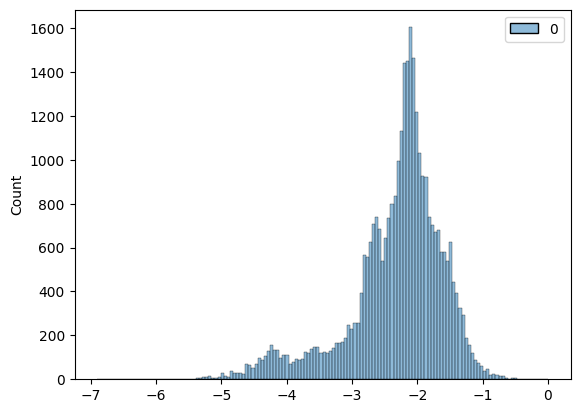

In [56]:
#Checking the distribution after scaling the values using minmax scaler and converting to log values.
sns.histplot(np.log(mms_values));

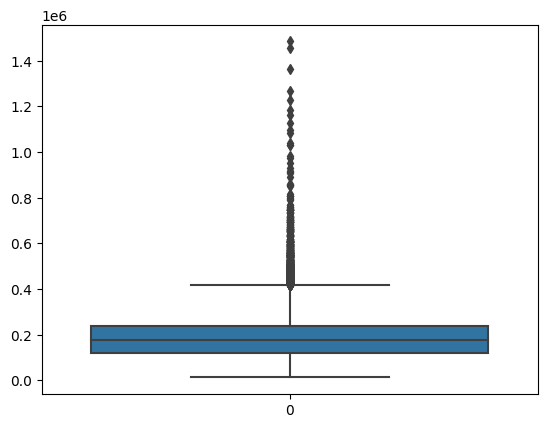

In [57]:
#Checking the values in boxplot of initial fnlwgt column
sns.boxplot(data_frame['fnlwgt']);

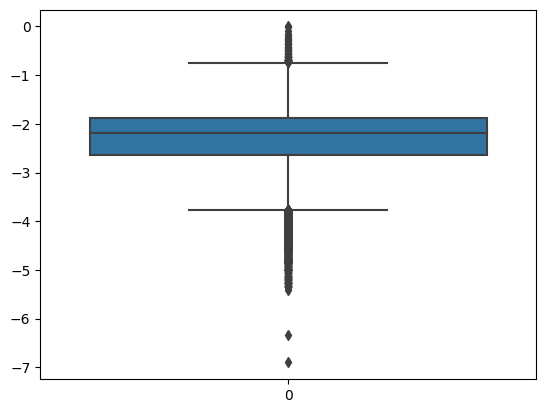

In [58]:
#checking the values in the box plot to check outliers beyond fences
sns.boxplot(np.log(mms_values));

In [59]:
import plotly.express as px

Position of scatter points before transformation

In [60]:
px.scatter(data_frame['fnlwgt'])

Position of scatter points after transformation into log values

In [61]:
px.scatter(np.log(mms_values))

In [62]:
data_frame['fnlwgt'][data_frame['fnlwgt']>1500]

0         77516
1         83311
2        215646
3        234721
4        338409
          ...  
32556    257302
32557    154374
32558    151910
32559    201490
32560    287927
Name: fnlwgt, Length: 32561, dtype: int64

In [63]:
round(round(245/1200,4)*100,2)

20.42

In [64]:
#defining a method to get the values below the lower fence and above the higher fence
def fence(data):
    sorted_values=np.sort(data)
    q1_index=round(len(sorted_values)*0.25)
    q1_value=sorted_values[q1_index]
    median_value=np.median(sorted_values)
    q3_index=round(len(sorted_values)*0.75)
    q3_value=sorted_values[q3_index]
    #################
    print('First quantile: ',q1_value)
    print('First quantile index value: ',q1_index)
    print('Third quantile: ',q3_value)
    print('Third quantile index value: ',q3_index)
    print('------------------------------------------')
    iqr=q3_value-q1_value
    print('Inter quantile range: ',iqr)
    # Calculating the lower fence, higher fence
    lower_fence=q1_value-(1.5*iqr)
    higher_fence=q3_value+(1.5*iqr)
    print('Higher Fence: ',higher_fence)
    print('Lower Fence: ',lower_fence)
    lower_fence_values=sorted_values[sorted_values<lower_fence]
    higher_fence_values=sorted_values[sorted_values>higher_fence]
    outliers_len=len(lower_fence_values)+len(higher_fence_values)
    print('--------------------------------------------------------')
    print('Length of outlier values: ',outliers_len)
    print('Percentage of outlier values: ',round((outliers_len/len(data_frame))*100,2),'%')
    return lower_fence_values,higher_fence_values

In [65]:
#checking the percentage of outlier values after transforming the mms_values into log
lower_fence_values, higher_fence_values=fence(list(pd.DataFrame(np.log(mms_values))[0]))

First quantile:  -2.635553606718985
First quantile index value:  8140
Third quantile:  -1.8795404385879104
Third quantile index value:  24421
------------------------------------------
Inter quantile range:  0.7560131681310747
Higher Fence:  -0.7455206863912984
Lower Fence:  -3.769573358915597
--------------------------------------------------------
Length of outlier values:  2089
Percentage of outlier values:  6.42 %


In [66]:
#checking the percentage of outlier values after transforming the mms_values into square root
lower_fence_values,higher_fence_values=fence(list(pd.DataFrame(np.sqrt(mms_values))[0]))

First quantile:  0.2677298569331573
First quantile index value:  8140
Third quantile:  0.39071760441153375
Third quantile index value:  24421
------------------------------------------
Inter quantile range:  0.12298774747837643
Higher Fence:  0.5751992256290984
Lower Fence:  0.08324823571559267
--------------------------------------------------------
Length of outlier values:  468
Percentage of outlier values:  1.44 %


In [67]:
#checking the percentage of outlier values after transforming the mms_values
_,_=fence(list(pd.DataFrame(mms_values)[0]))

First quantile:  0.07167927629344888
First quantile index value:  8140
Third quantile:  0.15266024639708778
Third quantile index value:  24421
------------------------------------------
Inter quantile range:  0.0809809701036389
Higher Fence:  0.2741317015525461
Lower Fence:  -0.04979217886200947
--------------------------------------------------------
Length of outlier values:  990
Percentage of outlier values:  3.04 %


In [68]:
#checking the percentage of outlier values after transforming the scaled_values
lf,hf=fence(list(pd.DataFrame(scaled_values)[0]))

First quantile:  -0.6816910147950545
First quantile index value:  8140
Third quantile:  0.4480091863606839
Third quantile index value:  24421
------------------------------------------
Inter quantile range:  1.1297002011557384
Higher Fence:  2.1425594880942915
Lower Fence:  -2.376241316528662
--------------------------------------------------------
Length of outlier values:  990
Percentage of outlier values:  3.04 %


In [69]:
#checking the percentage of outlier values after transforming the scaled_values into exponential
lf,hf=fence(list(pd.DataFrame(np.exp(scaled_values))[0]))

First quantile:  0.5057610194714609
First quantile index value:  8140
Third quantile:  1.565193074015597
Third quantile index value:  24421
------------------------------------------
Inter quantile range:  1.059432054544136
Higher Fence:  3.1543411558318013
Lower Fence:  -1.0833870623447432
--------------------------------------------------------
Length of outlier values:  3956
Percentage of outlier values:  12.15 %


In [70]:
#checking the percentage of outlier values after transforming the mms_values into exponential
lf,hf=fence(list(pd.DataFrame(np.exp(mms_values))[0]))

First quantile:  1.0743107318842022
First quantile index value:  8140
Third quantile:  1.1649291228331562
Third quantile index value:  24421
------------------------------------------
Inter quantile range:  0.09061839094895396
Higher Fence:  1.3008567092565873
Lower Fence:  0.9383831454607713
--------------------------------------------------------
Length of outlier values:  1265
Percentage of outlier values:  3.89 %


In [71]:
#checking the percentage of outlier values after transforming the mms_values into sqrt twice
_,_=fence(list(np.sqrt(pd.DataFrame(np.sqrt(mms_values))[0].sort_values())))

First quantile:  0.517426185009183
First quantile index value:  8140
Third quantile:  0.6250740791390519
Third quantile index value:  24421
------------------------------------------
Inter quantile range:  0.10764789412986886
Higher Fence:  0.7865459203338552
Lower Fence:  0.35595434381437974
--------------------------------------------------------
Length of outlier values:  1485
Percentage of outlier values:  4.56 %


In [72]:
#checking the percentage of outlier values after transforming the mms_values into sqrt and exp
_,_=fence(list(np.exp(pd.DataFrame(np.sqrt(mms_values))[0].sort_values())))

First quantile:  1.306994016948126
First quantile index value:  8140
Third quantile:  1.478041062197194
Third quantile index value:  24421
------------------------------------------
Inter quantile range:  0.171047045249068
Higher Fence:  1.734611630070796
Lower Fence:  1.0504234490745241
--------------------------------------------------------
Length of outlier values:  583
Percentage of outlier values:  1.79 %


The next steps were transforming the values in mms_values and checking the percentage of outliers exist

In [73]:
_,_=fence(list(np.sqrt(np.exp(pd.DataFrame(np.sqrt(mms_values))[0].sort_values()))))

First quantile:  1.1432383902529366
First quantile index value:  8140
Third quantile:  1.2157471209907076
Third quantile index value:  24421
------------------------------------------
Inter quantile range:  0.07250873073777098
Higher Fence:  1.3245102170973642
Lower Fence:  1.0344752941462803
--------------------------------------------------------
Length of outlier values:  475
Percentage of outlier values:  1.46 %


In [74]:
_,_=fence(list(np.sqrt(np.sqrt(np.exp(pd.DataFrame(np.sqrt(mms_values))[0].sort_values())))))

First quantile:  1.0692232649231574
First quantile index value:  8140
Third quantile:  1.1026092331332564
Third quantile index value:  24421
------------------------------------------
Inter quantile range:  0.03338596821009898
Higher Fence:  1.152688185448405
Lower Fence:  1.019144312608009
--------------------------------------------------------
Length of outlier values:  464
Percentage of outlier values:  1.43 %


In [75]:
ss_data=np.sqrt(np.sqrt(np.exp(pd.DataFrame(np.sqrt(mms_values))[0].sort_values())))
_,_=fence(np.sqrt(ss_data))

First quantile:  1.0340325260470085
First quantile index value:  8140
Third quantile:  1.0500520144894043
Third quantile index value:  24421
------------------------------------------
Inter quantile range:  0.01601948844239587
Higher Fence:  1.0740812471529981
Lower Fence:  1.0100032933834147
--------------------------------------------------------
Length of outlier values:  463
Percentage of outlier values:  1.42 %


We will consider the method which gave 1.42% of outliers based on quantile fences.

In [76]:
data_frame['salary'].value_counts()

salary
 <=50K    24720
 >50K      7841
Name: count, dtype: int64

In [77]:
px.scatter(data_frame[data_frame['salary']==' <=50K']['fnlwgt'])

In [78]:
px.scatter(data_frame[data_frame['salary']==' >50K']['fnlwgt'])

In [79]:
lower_fence,higher_fence=fence(list(np.sqrt(ss_data)))

First quantile:  1.0340325260470085
First quantile index value:  8140
Third quantile:  1.0500520144894043
Third quantile index value:  24421
------------------------------------------
Inter quantile range:  0.01601948844239587
Higher Fence:  1.0740812471529981
Lower Fence:  1.0100032933834147
--------------------------------------------------------
Length of outlier values:  463
Percentage of outlier values:  1.42 %


Finally, the percentage of outlier values is around 1.42%. So, we can consider removing the rows associated with them or we need to replace them using median. But, when using z_score we don't find the outlier values in the column's data.

In [80]:
np.log(mms_values)

array([[-3.11672777],
       [-3.03161658],
       [-1.97967986],
       ...,
       [-2.35570233],
       [-2.0518315 ],
       [-1.67555966]])

In [81]:
_,_=fence(list(pd.DataFrame(np.log(mms_values))[0]))

First quantile:  -2.635553606718985
First quantile index value:  8140
Third quantile:  -1.8795404385879104
Third quantile index value:  24421
------------------------------------------
Inter quantile range:  0.7560131681310747
Higher Fence:  -0.7455206863912984
Lower Fence:  -3.769573358915597
--------------------------------------------------------
Length of outlier values:  2089
Percentage of outlier values:  6.42 %


In [82]:
outliers(pd.DataFrame(np.log(mms_values))[0])

[]

In [83]:
outliers(pd.DataFrame(np.log(scaled_values))[0])

[]

In [84]:
outliers(pd.DataFrame(np.log(scaled_values))[0])

[]

In [85]:
outliers(pd.DataFrame(np.log(mms_values))[0])

[]

0        0.044302
1        0.048238
2        0.138113
3        0.151068
4        0.221488
           ...   
32556    0.166404
32557    0.096500
32558    0.094827
32559    0.128499
32560    0.187203
Name: 0, Length: 32561, dtype: float64

In [147]:
fence(np.sqrt(data_frame['fnlwgt']))

First quantile:  343.2593771479521
First quantile index value:  8140
Third quantile:  486.89321211123905
Third quantile index value:  24421
------------------------------------------
Inter quantile range:  143.63383496328697
Higher Fence:  702.3439645561696
Lower Fence:  127.80862470302162
--------------------------------------------------------
Length of outlier values:  409
Percentage of outlier values:  1.26 %


(array([110.83771921, 117.3413823 , 121.97540736]),
 array([ 702.3980353 ,  702.45498076,  702.63005913,  702.75315723,
         703.00995726,  703.30505472,  703.40884271,  703.60571345,
         704.19315532,  704.25989521,  704.29042305,  704.54382405,
         704.56653341,  704.64601042,  704.65452528,  704.79997162,
         704.88013165,  705.16168359,  705.18082787,  705.19500849,
         705.32687458,  705.54092723,  705.74712185,  705.84417544,
         705.92138372,  705.9235086 ,  705.93838258,  706.24712389,
         706.24712389,  706.40002831,  706.53874628,  706.56422213,
         706.57554444,  707.06081775,  707.1081954 ,  707.46660699,
         707.61571492,  707.91524916,  707.93502527,  707.93502527,
         708.28737106,  708.74254846,  709.05006875,  709.11000557,
         709.23338895,  709.54492458,  709.70064112,  709.87534117,
         710.4400045 ,  710.4400045 ,  710.5427503 ,  710.59904306,
         710.71724335,  710.94162911,  711.32271157,  711.322711

In [86]:
ss_data=np.sqrt(np.sqrt(np.exp(pd.DataFrame(np.sqrt(mms_values))[0].sort_values())))
_,_=fence(np.sqrt(ss_data))

First quantile:  1.0340325260470085
First quantile index value:  8140
Third quantile:  1.0500520144894043
Third quantile index value:  24421
------------------------------------------
Inter quantile range:  0.01601948844239587
Higher Fence:  1.0740812471529981
Lower Fence:  1.0100032933834147
--------------------------------------------------------
Length of outlier values:  463
Percentage of outlier values:  1.42 %


In [87]:
fence(np.log(ss_data))

First quantile:  0.06693246423328926
First quantile index value:  8140
Third quantile:  0.09767940110288356
Third quantile index value:  24421
------------------------------------------
Inter quantile range:  0.030746936869594302
Higher Fence:  0.14379980640727502
Lower Fence:  0.020812058928897807
--------------------------------------------------------
Length of outlier values:  468
Percentage of outlier values:  1.44 %


(array([0.        , 0.00793672, 0.01049121, 0.01666401, 0.01714981,
        0.01725837, 0.01725837, 0.01725837, 0.01725837, 0.01725837,
        0.01737237, 0.01737237, 0.01739068, 0.01748925, 0.01752441,
        0.01774107, 0.01780317, 0.01785198, 0.01791606, 0.01791606,
        0.01797755, 0.01799525, 0.01799525, 0.01799525, 0.01799525,
        0.01816312, 0.01816312, 0.01821097, 0.01821447, 0.01822378,
        0.01830513, 0.01844028, 0.01845409, 0.01847133, 0.01848282,
        0.018603  , 0.01863833, 0.01863833, 0.01868155, 0.01868609,
        0.0187122 , 0.0187122 , 0.0187122 , 0.01887257, 0.01893096,
        0.01900592, 0.01900592, 0.01900592, 0.01900592, 0.01902155,
        0.01918155, 0.01918487, 0.01918487, 0.01933802, 0.01934461,
        0.01940267, 0.01942453, 0.01956823, 0.01974745, 0.01991227,
        0.01991227, 0.01998887, 0.01998887, 0.01998887, 0.02008843,
        0.02015593, 0.02017698, 0.02020851, 0.02035084, 0.02036439,
        0.02046731, 0.02046835, 0.02050046, 0.02

In [154]:
outlier_percentage=round((len(outliers(np.sqrt(data_frame['fnlwgt'])))/len(data_frame))*100,2)
print('Percentage of outliers for sqrt fnlwgt when detected using z-score: ',outlier_percentage,'%')

Percentage of outliers for sqrt fnlwgt when detected using z-score:  0.42 %


In [111]:
outlier_percentage=round((len(outliers(ss_data))/len(data_frame))*100,2)
print('Percentage of outliers for ss_data when detected using z-score: ',outlier_percentage,'%')

Percentage of outliers for ss_data when detected using z-score:  0.44 %


In [112]:
outlier_percentage=round((len(outliers(np.log(ss_data)))/len(data_frame))*100,2)
print('Percentage of outliers for ss_data after converting to log values, when detected using z-score: ',outlier_percentage,'%')

Percentage of outliers for ss_data after converting to log values, when detected using z-score:  0.35 %


In [113]:
outlier_percentage=round((len(outliers(np.sqrt(ss_data)))/len(data_frame))*100,2)
print('Percentage of outliers for ss_data after converting to square root values when detected using z-score: ',outlier_percentage,'%')

Percentage of outliers for ss_data after converting to square root values when detected using z-score:  0.38 %


After checking the above methods to detect the outliers. Only, scaling the values using minmax scaler and transforming them minimized the outlier values in the fnlwgt feature. 

Checking the outliers for age

In [90]:
np.unique(np.sort(outliers(data_frame['age'])))

array([80, 81, 82, 83, 84, 85, 86, 87, 88, 90])

In [91]:
#converting the values in age feature to square root
outliers(np.sqrt(data_frame['age']))

[9.486832980505138,
 9.486832980505138,
 9.486832980505138,
 9.486832980505138,
 9.486832980505138,
 9.486832980505138,
 9.486832980505138,
 9.486832980505138,
 9.486832980505138,
 9.486832980505138,
 9.486832980505138,
 9.486832980505138,
 9.486832980505138,
 9.486832980505138,
 9.486832980505138,
 9.486832980505138,
 9.486832980505138,
 9.486832980505138,
 9.486832980505138,
 9.486832980505138,
 9.486832980505138,
 9.486832980505138,
 9.486832980505138,
 9.486832980505138,
 9.486832980505138,
 9.486832980505138,
 9.486832980505138,
 9.486832980505138,
 9.486832980505138,
 9.486832980505138,
 9.486832980505138,
 9.486832980505138,
 9.486832980505138,
 9.486832980505138,
 9.486832980505138,
 9.486832980505138,
 9.486832980505138,
 9.486832980505138,
 9.486832980505138,
 9.486832980505138,
 9.486832980505138,
 9.486832980505138,
 9.486832980505138]

In [92]:
np.sort(np.log(data_frame['age']))

array([2.83321334, 2.83321334, 2.83321334, ..., 4.49980967, 4.49980967,
       4.49980967])

In [93]:
fence(data_frame['age'])

First quantile:  28
First quantile index value:  8140
Third quantile:  48
Third quantile index value:  24421
------------------------------------------
Inter quantile range:  20
Higher Fence:  78.0
Lower Fence:  -2.0
--------------------------------------------------------
Length of outlier values:  143
Percentage of outlier values:  0.44 %


(array([], dtype=int64),
 array([79, 79, 79, 79, 79, 79, 79, 79, 79, 79, 79, 79, 79, 79, 79, 79, 79,
        79, 79, 79, 79, 79, 80, 80, 80, 80, 80, 80, 80, 80, 80, 80, 80, 80,
        80, 80, 80, 80, 80, 80, 80, 80, 80, 80, 81, 81, 81, 81, 81, 81, 81,
        81, 81, 81, 81, 81, 81, 81, 81, 81, 81, 81, 81, 81, 82, 82, 82, 82,
        82, 82, 82, 82, 82, 82, 82, 82, 83, 83, 83, 83, 83, 83, 84, 84, 84,
        84, 84, 84, 84, 84, 84, 84, 85, 85, 85, 86, 87, 88, 88, 88, 90, 90,
        90, 90, 90, 90, 90, 90, 90, 90, 90, 90, 90, 90, 90, 90, 90, 90, 90,
        90, 90, 90, 90, 90, 90, 90, 90, 90, 90, 90, 90, 90, 90, 90, 90, 90,
        90, 90, 90, 90, 90, 90, 90]))

In [94]:
fence(np.log(data_frame['age']))

First quantile:  3.332204510175204
First quantile index value:  8140
Third quantile:  3.871201010907891
Third quantile index value:  24421
------------------------------------------
Inter quantile range:  0.5389965007326873
Higher Fence:  4.679695762006922
Lower Fence:  2.523709759076173
--------------------------------------------------------
Length of outlier values:  0
Percentage of outlier values:  0.0 %


(array([], dtype=float64), array([], dtype=float64))

Converting the values in age to log gives no outliers. So, we gotta proceed with log values for age feature

In [95]:
data_frame.nunique()

age                  73
workclass             9
fnlwgt            21648
education            16
education-num        16
marital-status        7
occupation           15
relationship          6
race                  5
sex                   2
capital-gain        119
capital-loss         92
hours-per-week       94
country              42
salary                2
dtype: int64

In [96]:
np.sort(data_frame['capital-loss'].value_counts().index)

array([   0,  155,  213,  323,  419,  625,  653,  810,  880,  974, 1092,
       1138, 1258, 1340, 1380, 1408, 1411, 1485, 1504, 1539, 1564, 1573,
       1579, 1590, 1594, 1602, 1617, 1628, 1648, 1651, 1668, 1669, 1672,
       1719, 1721, 1726, 1735, 1740, 1741, 1755, 1762, 1816, 1825, 1844,
       1848, 1876, 1887, 1902, 1944, 1974, 1977, 1980, 2001, 2002, 2042,
       2051, 2057, 2080, 2129, 2149, 2163, 2174, 2179, 2201, 2205, 2206,
       2231, 2238, 2246, 2258, 2267, 2282, 2339, 2352, 2377, 2392, 2415,
       2444, 2457, 2467, 2472, 2489, 2547, 2559, 2603, 2754, 2824, 3004,
       3683, 3770, 3900, 4356])

In [97]:
#Now, checking for capital-loss
np.unique(outliers(data_frame['capital-loss']))

array([1340, 1380, 1408, 1411, 1485, 1504, 1539, 1564, 1573, 1579, 1590,
       1594, 1602, 1617, 1628, 1648, 1651, 1668, 1669, 1672, 1719, 1721,
       1726, 1735, 1740, 1741, 1755, 1762, 1816, 1825, 1844, 1848, 1876,
       1887, 1902, 1944, 1974, 1977, 1980, 2001, 2002, 2042, 2051, 2057,
       2080, 2129, 2149, 2163, 2174, 2179, 2201, 2205, 2206, 2231, 2238,
       2246, 2258, 2267, 2282, 2339, 2352, 2377, 2392, 2415, 2444, 2457,
       2467, 2472, 2489, 2547, 2559, 2603, 2754, 2824, 3004, 3683, 3770,
       3900, 4356])

In [98]:
fence(np.sqrt(data_frame['capital-loss']))

First quantile:  0.0
First quantile index value:  8140
Third quantile:  0.0
Third quantile index value:  24421
------------------------------------------
Inter quantile range:  0.0
Higher Fence:  0.0
Lower Fence:  0.0
--------------------------------------------------------
Length of outlier values:  1519
Percentage of outlier values:  4.67 %


(array([], dtype=float64),
 array([12.4498996 , 14.59451952, 14.59451952, ..., 66.        ,
        66.        , 66.        ]))

In [99]:
outliers(data_frame['capital-loss'].unique())

[4356]

In [100]:
#Checking for capital-gain
np.unique(outliers(data_frame['capital-gain']))

array([25124, 25236, 27828, 34095, 41310, 99999])

In [101]:
outliers(data_frame['capital-gain'].unique())

[99999, 41310]

Need not to transform the values of capital-gain and capital-loss features to remove the outliers where the nature of them doesn't affect the output.

Checking outliers for hours-per-week

In [102]:
data_frame['hours-per-week'].unique()

array([40, 13, 16, 45, 50, 80, 30, 35, 60, 20, 52, 44, 15, 25, 38, 43, 55,
       48, 58, 32, 70,  2, 22, 56, 41, 28, 36, 24, 46, 42, 12, 65,  1, 10,
       34, 75, 98, 33, 54,  8,  6, 64, 19, 18, 72,  5,  9, 47, 37, 21, 26,
       14,  4, 59,  7, 99, 53, 39, 62, 57, 78, 90, 66, 11, 49, 84,  3, 17,
       68, 27, 85, 31, 51, 77, 63, 23, 87, 88, 73, 89, 97, 94, 29, 96, 67,
       82, 86, 91, 81, 76, 92, 61, 74, 95])

In [103]:
np.sort(np.unique(outliers(data_frame['hours-per-week'])))

array([78, 80, 81, 82, 84, 85, 86, 87, 88, 89, 90, 91, 92, 94, 95, 96, 97,
       98, 99])

In [104]:
len(np.sort(np.unique(outliers(data_frame['hours-per-week']))))

19

In [105]:
fence(data_frame['hours-per-week'])

First quantile:  40
First quantile index value:  8140
Third quantile:  45
Third quantile index value:  24421
------------------------------------------
Inter quantile range:  5
Higher Fence:  52.5
Lower Fence:  32.5
--------------------------------------------------------
Length of outlier values:  9008
Percentage of outlier values:  27.66 %


(array([ 1,  1,  1, ..., 32, 32, 32]), array([53, 53, 53, ..., 99, 99, 99]))

In [106]:
np.sort(np.unique(outliers(np.sqrt(data_frame['hours-per-week']))))

array([9.43398113, 9.48683298, 9.53939201, 9.59166305, 9.69535971,
       9.74679434, 9.79795897, 9.8488578 , 9.89949494, 9.94987437])

In [107]:
len(np.sort(np.unique(outliers(np.sqrt(data_frame['hours-per-week'])))))

10

In [108]:
np.sort(np.unique(outliers(np.log(data_frame['hours-per-week']))))

array([], dtype=float64)

In [109]:
np.sort(np.log(data_frame['hours-per-week']))

array([0.        , 0.        , 0.        , ..., 4.59511985, 4.59511985,
       4.59511985])

Need to transform the hours-per-week to log values 

In [151]:
fence(np.sqrt(mms_values))

First quantile:  [0.48409806]
First quantile index value:  8140
Third quantile:  [0.24396938]
Third quantile index value:  24421
------------------------------------------
Inter quantile range:  [-0.24012868]
Higher Fence:  [-0.11622363]
Lower Fence:  [0.84429108]
--------------------------------------------------------
Length of outlier values:  65112
Percentage of outlier values:  199.97 %


(array([0.21048016, 0.21963059, 0.37163617, ..., 0.30793974, 0.35846805,
        0.43267006]),
 array([0.21048016, 0.21963059, 0.37163617, ..., 0.30793974, 0.35846805,
        0.43267006]))